# Dreambooth
### Notebook implementation by Joe Penna (@MysteryGuitarM on Twitter) - Improvements by David Bielejeski

### Instructions
- Sign up for RunPod here: https://runpod.io/?ref=n8yfwyum
    - Note: That's my personal referral link. Please don't use it if we are mortal enemies.

- Click *Deploy* on either `SECURE CLOUD` or `COMMUNITY CLOUD`

- Follow the rest of the instructions in this video: https://www.youtube.com/watch?v=7m__xadX0z0#t=5m33.1s

Latest information on:
https://github.com/JoePenna/Dreambooth-Stable-Diffusion

## Build Environment

In [ ]:
# If running on Vast.AI, copy the code in this cell into a new notebook. Run it, then launch the `dreambooth_runpod_joepenna.ipynb` notebook from the jupyter interface.
!git clone https://github.com/JoePenna/Dreambooth-Stable-Diffusion

In [7]:
#BUILD ENV
!pip install omegaconf
!pip install einops
!pip install pytorch-lightning==1.6.5
!pip install test-tube
!pip install transformers
!pip install kornia
!pip install -e git+https://github.com/CompVis/taming-transformers.git@master#egg=taming-transformers
!pip install -e git+https://github.com/openai/CLIP.git@main#egg=clip
!pip install setuptools==59.5.0
!pip install pillow==9.0.1
!pip install torchmetrics==0.6.0
!pip install -e .
!pip install protobuf==3.20.1
#!pip install protobuf==3.9.2
!pip install gdown
!pip install pydrive
!pip install -qq diffusers["training"]==0.3.0 transformers ftfy
!pip install -qq "ipywidgets>=7,<8"
!pip install huggingface_hub
!pip install ipywidgets==7.7.1

  Using cached pytorch_lightning-1.6.5-py3-none-any.whl (585 kB)


  Attempting uninstall: pytorch-lightning
    Found existing installation: pytorch-lightning 1.7.2
    Uninstalling pytorch-lightning-1.7.2:
      Successfully uninstalled pytorch-lightning-1.7.2


Obtaining taming-transformers from git+https://github.com/CompVis/taming-transformers.git@master#egg=taming-transformers
  Updating ./src/taming-transformers clone (to revision master)
  Running command git fetch -q --tags
  Running command git reset --hard -q 24268930bf1dce879235a7fddd0b2355b84d7ea6
  Preparing metadata (setup.py) ... done
  Attempting uninstall: taming-transformers
    Found existing installation: taming-transformers 0.0.1
    Uninstalling taming-transformers-0.0.1:
      Successfully uninstalled taming-transformers-0.0.1
  Running setup.py develop for taming-transformers
Obtaining clip from git+https://github.com/openai/CLIP.git@main#egg=clip
  Updating ./src/clip clone (to revision main)
  Running command git fetch -q --tags
  Running command git reset --hard -q d50d76daa670286dd6cacf3bcd80b5e4823fc8e1
  Preparing metadata (setup.py) ... done
  Attempting uninstall: clip
    Found existing installation: clip 1.0
    Uninstalling clip-1.0:
      Successfully uninsta

  Using cached protobuf-4.21.7-cp37-abi3-manylinux2014_x86_64.whl (408 kB)
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.20.1
    Uninstalling protobuf-3.20.1:
      Successfully uninstalled protobuf-3.20.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorboard 2.10.1 requires protobuf<3.20,>=3.9.2, but you have protobuf 4.21.7 which is incompatible.
pytorch-lightning 1.6.5 requires protobuf<=3.20.1, but you have protobuf 4.21.7 which is incompatible.
onnx 1.12.0 requires protobuf<=3.20.1,>=3.12.2, but you have protobuf 4.21.7 which is incompatible.


In [8]:
pip install --upgrade protobuf==3.20.0
#pip install --upgrade protobuf==3.19.5
pip install torch==1.9.0+cu111 torchvision==0.10.0+cu111 torchaudio==0.9.0 -f https://download.pytorch.org/whl/torch_stable.html

  Using cached protobuf-3.20.0-cp37-cp37m-manylinux_2_5_x86_64.manylinux1_x86_64.whl (1.0 MB)
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.19.6
    Uninstalling protobuf-3.19.6:
      Successfully uninstalled protobuf-3.19.6
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorboard 2.10.1 requires protobuf<3.20,>=3.9.2, but you have protobuf 3.20.0 which is incompatible.
google-api-core 2.10.2 requires protobuf!=3.20.0,!=3.20.1,!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<5.0.0dev,>=3.19.5, but you have protobuf 3.20.0 which is incompatible.
Note: you may need to restart the kernel to use updated packages.


In [1]:
## Login to stable diffusion 
from huggingface_hub import notebook_login

notebook_login()

Login successful
Your token has been saved to /home/ubuntu/.huggingface/token
Authenticated through git-credential store but this isn't the helper defined on your machine.
You might have to re-authenticate when pushing to the Hugging Face Hub. Run the following command in your terminal in case you want to set this credential helper as the default

git config --global credential.helper store


In [ ]:
# SET MODEL ON ROOT REPO FOLDER SALTEADO
model="model_dotcsv_v2.ckpt"
mv $model model.ckpt

In [3]:
## Download the 1.4 sd model 
from huggingface_hub import hf_hub_download
downloaded_model_path = hf_hub_download(
 repo_id="CompVis/stable-diffusion-v-1-4-original",
 filename="sd-v1-4.ckpt",
 use_auth_token=True
)

Downloading:   0%|          | 0.00/4.27G [00:00<?, ?B/s]

In [2]:
## Move the sd-v1-4.ckpt to the root of this directory as "model.ckpt"
actual_locations_of_model_blob = !readlink -f {downloaded_model_path}
!mv {actual_locations_of_model_blob[-1]} model.ckpt

mv: cannot stat '/home/ubuntu/.jupyter/MyNotebooks/JoePenna/{downloaded_model_path}': No such file or directory


## Download pre-generated regularization images

We've created the following image sets

* man_euler - provided by Niko Pueringer (Corridor Digital) - euler @ 40 steps, CFG 7.5
* man_unsplash - pictures from various photographers
* person_ddim
* woman_ddim - provided by David Bielejeski - ddim @ 50 steps, CFG 10.0

`person_ddim` is recommended

In [6]:
# Delete previous folder before clone again

# Grab the existing regularization images
# Choose the dataset that best represents what you are trying to do and matches what you used for your token
# man_euler, man_unsplash, person_ddim, woman_ddim
dataset="person_ddim"
!git clone https://github.com/djbielejeski/Stable-Diffusion-Regularization-Images-{dataset}.git

Cloning into 'Stable-Diffusion-Regularization-Images-person_ddim'...
remote: Enumerating objects: 1503, done.
remote: Total 1503 (delta 0), reused 0 (delta 0), pack-reused 1503
Receiving objects: 100% (1503/1503), 657.41 MiB | 48.39 MiB/s, done.
Updating files: 100% (1500/1500), done.


In [7]:
!mkdir -p outputs/txt2img-samples/samples/{dataset}
!mv -v Stable-Diffusion-Regularization-Images-{dataset}/{dataset}/*.* outputs/txt2img-samples/samples/{dataset}

renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00000.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00000.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00001.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00001.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00002.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00002.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00003.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00003.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00004.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00004.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00005.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00005.png'
rena

renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00059.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00059.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00060.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00060.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00061.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00061.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00062.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00062.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00063.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00063.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00064.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00064.png'
rena

renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00109.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00109.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00110.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00110.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00111.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00111.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00112.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00112.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00113.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00113.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00114.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00114.png'
rena

renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00164.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00164.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00165.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00165.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00166.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00166.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00167.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00167.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00168.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00168.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00169.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00169.png'
rena

renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00222.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00222.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00223.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00223.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00224.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00224.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00225.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00225.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00226.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00226.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00227.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00227.png'
rena

renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00284.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00284.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00285.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00285.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00286.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00286.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00287.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00287.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00288.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00288.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00289.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00289.png'
rena

renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00336.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00336.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00337.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00337.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00338.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00338.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00339.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00339.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00340.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00340.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00341.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00341.png'
rena

renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00388.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00388.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00389.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00389.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00390.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00390.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00391.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00391.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00392.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00392.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00393.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00393.png'
rena

renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00448.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00448.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00449.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00449.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00450.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00450.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00451.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00451.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00452.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00452.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00453.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00453.png'
rena

renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00504.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00504.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00505.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00505.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00506.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00506.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00507.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00507.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00508.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00508.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00509.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00509.png'
rena

renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00565.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00565.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00566.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00566.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00567.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00567.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00568.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00568.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00569.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00569.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00570.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00570.png'
rena

renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00617.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00617.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00618.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00618.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00619.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00619.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00620.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00620.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00621.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00621.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00622.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00622.png'
rena

renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00670.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00670.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00671.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00671.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00672.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00672.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00673.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00673.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00674.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00674.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00675.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00675.png'
rena

renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00727.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00727.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00728.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00728.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00729.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00729.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00730.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00730.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00731.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00731.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00732.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00732.png'
rena

renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00778.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00778.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00779.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00779.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00780.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00780.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00781.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00781.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00782.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00782.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00783.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00783.png'
rena

renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00829.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00829.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00830.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00830.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00831.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00831.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00832.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00832.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00833.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00833.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00834.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00834.png'
rena

renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00881.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00881.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00882.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00882.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00883.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00883.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00884.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00884.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00885.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00885.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00886.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00886.png'
rena

renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00936.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00936.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00937.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00937.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00938.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00938.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00939.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00939.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00940.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00940.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00941.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00941.png'
rena

renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00993.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00993.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00994.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00994.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00995.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00995.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00996.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00996.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00997.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00997.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00998.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_00998.png'
rena

renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01046.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01046.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01047.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01047.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01048.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01048.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01049.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01049.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01050.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01050.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01051.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01051.png'
rena

renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01103.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01103.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01104.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01104.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01105.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01105.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01106.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01106.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01107.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01107.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01108.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01108.png'
rena

renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01153.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01153.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01154.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01154.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01155.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01155.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01156.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01156.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01157.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01157.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01158.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01158.png'
rena

renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01203.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01203.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01204.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01204.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01205.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01205.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01206.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01206.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01207.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01207.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01208.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01208.png'
rena

renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01255.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01255.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01256.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01256.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01257.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01257.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01258.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01258.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01259.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01259.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01260.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01260.png'
rena

renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01315.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01315.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01316.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01316.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01317.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01317.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01318.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01318.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01319.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01319.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01320.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01320.png'
rena

renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01366.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01366.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01367.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01367.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01368.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01368.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01369.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01369.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01370.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01370.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01371.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01371.png'
rena

renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01418.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01418.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01419.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01419.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01420.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01420.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01421.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01421.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01422.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01422.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01423.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01423.png'
rena

renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01470.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01470.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01471.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01471.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01472.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01472.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01473.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01473.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01474.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01474.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01475.png' -> 'outputs/txt2img-samples/samples/person_ddim/person_ddim_01475.png'
rena

# Upload your training images
Upload 10-20 images of someone to

```
/workspace/Dreambooth-Stable-Diffusion/training_samples
```

WARNING: Be sure to upload an *even* amount of images, otherwise the training inexplicably stops at 1500 steps.

*   2-3 full body
*   3-5 upper body 
*   5-12 close-up on face

The images should be:

- as close as possible to the kind of images you're trying to make (most of the time, that means no selfies).
- 

In [3]:
#@markdown Add here the URLs to the images of the subject you are adding
urls = [
 "https://i.imgur.com/test1.png",
 "https://i.imgur.com/test2.png",
 "https://i.imgur.com/test3.png",
 "https://i.imgur.com/test4.png",
 "https://i.imgur.com/test5.png",
 # You can add additional images here -- about 20-30 images in different 
]
urls = [
    
]

In [4]:
#@title Download and check the images you have just added
import os
import requests
from io import BytesIO
from PIL import Image


def image_grid(imgs, rows, cols):
 assert len(imgs) == rows*cols

 w, h = imgs[0].size
 grid = Image.new('RGB', size=(cols*w, rows*h))
 grid_w, grid_h = grid.size

 for i, img in enumerate(imgs):
  grid.paste(img, box=(i%cols*w, i//cols*h))
 return grid

def download_image(url):
 try:
  response = requests.get(url)
 except:
  return None
 return Image.open(BytesIO(response.content)).convert("RGB")

images = list(filter(None,[download_image(url) for url in urls]))
save_path = "./training_samples"
if not os.path.exists(save_path):
 os.mkdir(save_path)
[image.save(f"{save_path}/{i}.png", format="png") for i, image in enumerate(images)]
image_grid(images, 1, len(images))

IndexError: list index out of range

## Training

If training a person or subject, keep an eye on your project's `logs/{folder}/images/train/samples_scaled_gs-00xxxx` generations.

If training a style, keep an eye on your project's `logs/{folder}/images/train/samples_gs-00xxxx` generations.

## Edit the personalized.py file
Execute this cell `%load ldm/data/personalized.py`

Change `joepenna` to whatever you want it to be (but keep the {})

```
training_templates_smallest = [
    'joepenna {}',
]
```

I recommend using the name of a celebrity that:
1) kinda looks like you.
2) Stable Diffusion generates well (you can check by typing their name on DreamStudio)

Then paste this at the very top of the cell:
```
%%writefile ldm/data/personalized.py
```

Then run the cell again.  This will save your changes.


In [1]:
# %load ldm/data/personalized.py
import os
import numpy as np
import PIL
from PIL import Image
from torch.utils.data import Dataset
from torchvision import transforms

import random

training_templates_smallest = [
    'meuri {}',
]

reg_templates_smallest = [
    '{}',
]

imagenet_templates_small = [

    '{}',
]

imagenet_dual_templates_small = [
    '{} with {}'
]

per_img_token_list = [
    'א', 'ב', 'ג', 'ד', 'ה', 'ו', 'ז', 'ח', 'ט', 'י', 'כ', 'ל', 'מ', 'נ', 'ס', 'ע', 'פ', 'צ', 'ק', 'ר', 'ש', 'ת',
]


class PersonalizedBase(Dataset):
    def __init__(self,
                 data_root,
                 size=None,
                 repeats=100,
                 interpolation="bicubic",
                 flip_p=0.0,
                 set="train",
                 placeholder_token="dog",
                 per_image_tokens=False,
                 center_crop=False,
                 mixing_prob=0.25,
                 coarse_class_text=None,
                 reg=False
                 ):

        self.data_root = data_root

        self.image_paths = [os.path.join(
            self.data_root, file_path) for file_path in os.listdir(self.data_root)]
        print("PATHS:", self.image_paths)

        # self._length = len(self.image_paths)
        self.num_images = len(self.image_paths)
        self._length = self.num_images

        self.placeholder_token = placeholder_token

        self.per_image_tokens = per_image_tokens
        self.center_crop = center_crop
        self.mixing_prob = mixing_prob

        self.coarse_class_text = coarse_class_text

        if per_image_tokens:
            assert self.num_images < len(
                per_img_token_list), f"Can't use per-image tokens when the training set contains more than {len(per_img_token_list)} tokens. To enable larger sets, add more tokens to 'per_img_token_list'."

        if set == "train":
            self._length = self.num_images * repeats

        self.size = size
        self.interpolation = {"linear": PIL.Image.LINEAR,
                              "bilinear": PIL.Image.BILINEAR,
                              "bicubic": PIL.Image.BICUBIC,
                              "lanczos": PIL.Image.LANCZOS,
                              }[interpolation]
        self.flip = transforms.RandomHorizontalFlip(p=flip_p)
        self.reg = reg

    def __len__(self):
        return self._length

    def __getitem__(self, i):
        example = {}
        image = Image.open(self.image_paths[i % self.num_images])

        if not image.mode == "RGB":
            image = image.convert("RGB")

        placeholder_string = self.placeholder_token
        if self.coarse_class_text:
            placeholder_string = f"{self.coarse_class_text} {placeholder_string}"

        if not self.reg:
            text = random.choice(training_templates_smallest).format(
                placeholder_string)
        else:
            text = random.choice(reg_templates_smallest).format(
                placeholder_string)

        example["caption"] = text

        # default to score-sde preprocessing
        img = np.array(image).astype(np.uint8)

        if self.center_crop:
            crop = min(img.shape[0], img.shape[1])
            h, w, = img.shape[0], img.shape[1]
            img = img[(h - crop) // 2:(h + crop) // 2,
                      (w - crop) // 2:(w + crop) // 2]

        image = Image.fromarray(img)
        if self.size is not None:
            image = image.resize((self.size, self.size),
                                 resample=self.interpolation)

        image = self.flip(image)
        image = np.array(image).astype(np.uint8)
        example["image"] = (image / 127.5 - 1.0).astype(np.float32)
        return example


In [2]:
from PIL import Image
dataset="person_ddim"

# START THE TRAINING
project_name = "meuri"

# MAX STEPS
# It's how long you want your training to go.
# If you're seeing this message, I'm literally at my computer right now fixing this up:
max_training_steps = 1000

class_word = "person"  # << match this word to the class word from regularization images above
reg_data_root = "./outputs/txt2img-samples/samples/" + dataset

!rm -rf training_samples/.ipynb_checkpoints
!python "main.py" \
 --base configs/stable-diffusion/v1-finetune_unfrozen.yaml \
 -t \
 --actual_resume "sd-v1-4.ckpt" \
 --reg_data_root {reg_data_root} \
 -n {project_name} \
 --gpus 0, \
 --data_root "./training_samples/" \
 --max_training_steps {max_training_steps} \
 --class_word {class_word} \
 --no-test

Global seed set to 23
Running on GPUs 0,
Loading model from sd-v1-4.ckpt
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 64, 64) = 16384 dimensions.
making attention of type 'vanilla' with 512 in_channels
Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.13.mlp.fc2.bias', 'vision_model.encoder.layers.11.self_attn.out_proj.bias', 'vision_model.encoder.layers.17.self_attn.k_proj.bias', 'vision_model.pre_layrnorm.weight', 'vision_model.encoder.layers.17.layer_norm1.bias', 'vision_model.encoder.layers.8.self_attn.k_proj.bias', 'vision_model.encoder.layers.10.self_attn.q_proj.weight', 'vision_model.encoder.layers.6.mlp.fc2.bias', 'vision_model.encoder.layers.2.mlp.fc2.weight', 'vision_model.encoder.layers.0.layer_norm1.bias', 'vision_model.encoder.layers.10.layer_norm2.bia

Restored from sd-v1-4.ckpt with 0 missing and 2 unexpected keys
Unexpected Keys: ['model_ema.decay', 'model_ema.num_updates']
/opt/conda/envs/dl/lib/python3.7/site-packages/pytorch_lightning/loggers/test_tube.py:106: LightningDeprecationWarning: The TestTubeLogger is deprecated since v1.5 and will be removed in v1.7. We recommend switching to the `pytorch_lightning.loggers.TensorBoardLogger` as an alternative.
  "The TestTubeLogger is deprecated since v1.5 and will be removed in v1.7. We recommend switching to the"
Monitoring val/loss_simple_ema as checkpoint metric.
Merged modelckpt-cfg: 
{'target': 'pytorch_lightning.callbacks.ModelCheckpoint', 'params': {'dirpath': 'logs/training_samples2022-10-15T13-39-13_meuri/checkpoints', 'filename': '{epoch:06}', 'verbose': True, 'save_last': True, 'monitor': 'val/loss_simple_ema', 'save_top_k': 1, 'every_n_train_steps': 500}}
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU availa

/opt/conda/envs/dl/lib/python3.7/site-packages/pytorch_lightning/trainer/configuration_validator.py:327: LightningDeprecationWarning: Base `LightningModule.on_train_batch_start` hook signature has changed in v1.5. The `dataloader_idx` argument will be removed in v1.7.
  f"Base `LightningModule.{hook}` hook signature has changed in v1.5."
/opt/conda/envs/dl/lib/python3.7/site-packages/pytorch_lightning/trainer/configuration_validator.py:336: LightningDeprecationWarning: The `on_keyboard_interrupt` callback hook was deprecated in v1.5 and will be removed in v1.7. Please use the `on_exception` callback hook instead.
  "The `on_keyboard_interrupt` callback hook was deprecated in v1.5 and will be removed in v1.7."
/opt/conda/envs/dl/lib/python3.7/site-packages/pytorch_lightning/trainer/configuration_validator.py:392: LightningDeprecationWarning: The `Callback.on_pretrain_routine_start` hook has been deprecated in v1.6 and will be removed in v1.8. Please use `Callback.on_fit_start` instead.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LatentDiffusion: Also optimizing conditioner params!

  | Name              | Type               | Params
---------------------------------------------------------
0 | model             | DiffusionWrapper   | 859 M 
1 | first_stage_model | AutoencoderKL      | 83.7 M
2 | cond_stage_model  | FrozenCLIPEmbedder | 123 M 
---------------------------------------------------------
982 M     Trainable params
83.7 M    Non-trainable params
1.1 B     Total params
4,264.941 Total estimated model params size (MB)
Project config
model:
  base_learning_rate: 1.0e-06
  target: ldm.models.diffusion.ddpm.LatentDiffusion
  params:
    reg_weight: 1.0
    linear_start: 0.00085
    linear_end: 0.012
    num_timesteps_cond: 1
    log_every_t: 200
    timesteps: 1000
    first_stage_key: image
    cond_stage_key: caption
    image_size: 64
    channels: 4
    cond_stage_trainable: true
    conditioning_key: crossattn
    monitor: val/loss_simple_ema
    scale_facto

## Pruning (12GB to 2GB)
We are working on having this happen automatically (TODO: PR's welcome)

In [3]:
directory_paths = !ls -d logs/*

In [4]:
# This version should automatically prune around 10GB from the ckpt file
last_checkpoint_file = directory_paths[-1] + "/checkpoints/last.ckpt"
!python "prune_ckpt.py" --ckpt {last_checkpoint_file}

prunin' in path: logs/training_samples2022-10-15T13-39-13_meuri/checkpoints/last.ckpt
dict_keys(['epoch', 'global_step', 'pytorch-lightning_version', 'state_dict', 'loops', 'callbacks', 'optimizer_states', 'lr_schedulers'])
removing optimizer states for path logs/training_samples2022-10-15T13-39-13_meuri/checkpoints/last.ckpt
This is global step 1000.
saving pruned checkpoint at: logs/training_samples2022-10-15T13-39-13_meuri/checkpoints/last-pruned.ckpt
New ckpt size: 2.13 GB. Saved 9.99 GB by removing optimizer states


In [5]:
last_checkpoint_file_pruned = directory_paths[-1] + "/checkpoints/last-pruned.ckpt"
training_samples = !ls training_samples
date_string = !date +"%Y-%m-%dT%H-%M-%S"
file_name = date_string[-1] + "_" + project_name + "_" + str(len(training_samples)) + "_training_images_" +  str(max_training_steps) + "_max_training_steps_" + class_word + "_class_word.ckpt"
!mkdir -p trained_models
!mv {last_checkpoint_file_pruned} trained_models/{file_name}

In [ ]:
# Download your trained model file from `trained_models` and use in your favorite Stable Diffusion repo!

# Big Important Note!

The way to use your token is `<token> <class>` ie `joepenna person` and not just `joepenna`

## Generate Images With Your Trained Model!

In [ ]:
!python scripts/stable_txt2img.py \
 --ddim_eta 0.0 \
 --n_samples 16 \
 --n_iter 1 \
 --scale 7.0 \
 --ddim_steps 400 \
 --ckpt "./trained_models/2022-10-15T14-15-51_meuri_18_training_images_1000_max_training_steps_person_class_word.ckpt" \
 --prompt "photo of a meuri person driving a Lamborghini Diablo Car"

# --ckpt "./trained_models/" + {file_name} \

Global seed set to 42
Loading model from ./trained_models/2022-10-15T14-15-51_meuri_18_training_images_1000_max_training_steps_person_class_word.ckpt
Global Step: 1000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels
Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.14.mlp.fc2.weight', 'vision_model.encoder.layers.4.layer_norm1.bias', 'vision_model.encoder.layers.6.self_attn.k_proj.bias', 'vision_model.encoder.layers.10.layer_norm2.weight', 'vision_model.encoder.layers.1.layer_norm1.weight', 'vision_model.encoder.layers.18.self_attn.q_proj.bias', 'vision_model.encoder.layers.19.self_attn.v_proj.bias', 'vision_model.encoder.layers.21.mlp.fc1.weight', 'vision_model.encoder.layers.22.self_a

data:   0%|                                               | 0/1 [00:00<?, ?it/s]Data shape for DDIM sampling is (16, 4, 64, 64), eta 0.0
Running DDIM Sampling with 500 timesteps


DDIM Sampler:   0%|                                     | 0/500 [00:00<?, ?it/s]

DDIM Sampler:   0%|                             | 1/500 [00:02<17:07,  2.06s/it]

DDIM Sampler:   0%|                             | 2/500 [00:03<16:29,  1.99s/it]

DDIM Sampler:   1%|▏                            | 3/500 [00:05<16:04,  1.94s/it]

DDIM Sampler:   1%|▏                            | 4/500 [00:07<15:51,  1.92s/it]

DDIM Sampler:   1%|▎                            | 5/500 [00:09<15:43,  1.91s/it]

DDIM Sampler:   1%|▎                            | 6/500 [00:11<15:37,  1.90s/it]

DDIM Sampler:   1%|▍                            | 7/500 [00:13<15:33,  1.89s/it]

DDIM Sampler:   2%|▍                            | 8/500 [00:15<15:30,  1.89s/it]

DDIM Sampler:   2%|▌                            | 9/500 [00:17<15:27,  1.89s/it]



DDIM Sampler:  37%|█████████▉                 | 183/500 [05:45<09:57,  1.88s/it]

DDIM Sampler:  37%|█████████▉                 | 184/500 [05:46<09:55,  1.88s/it]

DDIM Sampler:  37%|█████████▉                 | 185/500 [05:48<09:53,  1.88s/it]

DDIM Sampler:  37%|██████████                 | 186/500 [05:50<09:51,  1.88s/it]

DDIM Sampler:  37%|██████████                 | 187/500 [05:52<09:49,  1.88s/it]

DDIM Sampler:  38%|██████████▏                | 188/500 [05:54<09:47,  1.88s/it]

DDIM Sampler:  38%|██████████▏                | 189/500 [05:56<09:45,  1.88s/it]

DDIM Sampler:  38%|██████████▎                | 190/500 [05:58<09:44,  1.88s/it]

DDIM Sampler:  38%|██████████▎                | 191/500 [06:00<09:42,  1.88s/it]

DDIM Sampler:  38%|██████████▎                | 192/500 [06:02<09:40,  1.88s/it]

DDIM Sampler:  39%|██████████▍                | 193/500 [06:03<09:38,  1.88s/it]

DDIM Sampler:  39%|██████████▍                | 194/500 [06:05<09:36,  1.88s/it]

DDIM Sampler:  3

DDIM Sampler:  74%|███████████████████▉       | 369/500 [11:35<04:06,  1.88s/it]

DDIM Sampler:  74%|███████████████████▉       | 370/500 [11:37<04:04,  1.88s/it]

DDIM Sampler:  74%|████████████████████       | 371/500 [11:39<04:03,  1.88s/it]

DDIM Sampler:  74%|████████████████████       | 372/500 [11:41<04:01,  1.88s/it]

DDIM Sampler:  75%|████████████████████▏      | 373/500 [11:43<03:59,  1.88s/it]

DDIM Sampler:  75%|████████████████████▏      | 374/500 [11:44<03:57,  1.88s/it]

DDIM Sampler:  75%|████████████████████▎      | 375/500 [11:46<03:55,  1.88s/it]

outputs/txt2img-samples/photo of a meuri person_0.png


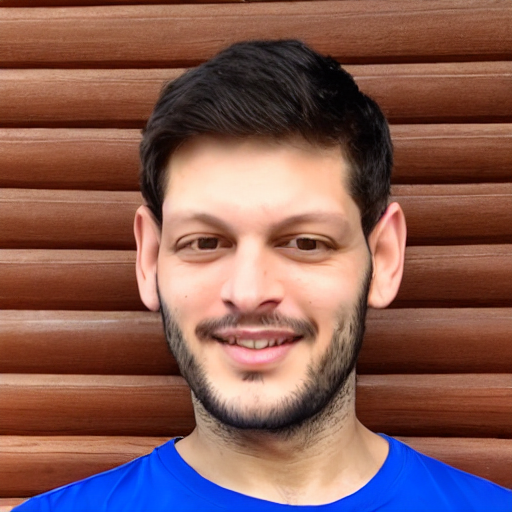

outputs/txt2img-samples/photo of a meuri person_1.png


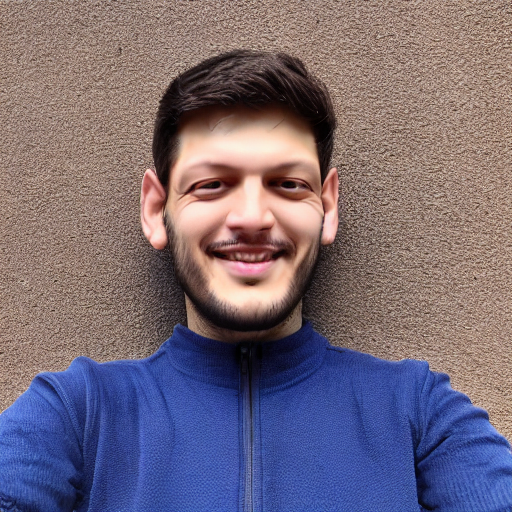

outputs/txt2img-samples/photo of a meuri person_2.png


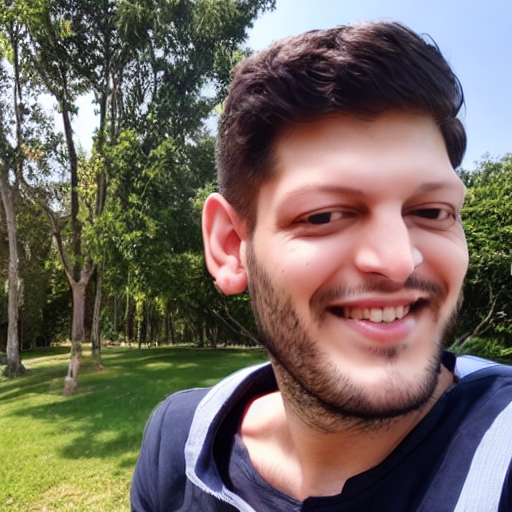

outputs/txt2img-samples/photo of a meuri person_3.png


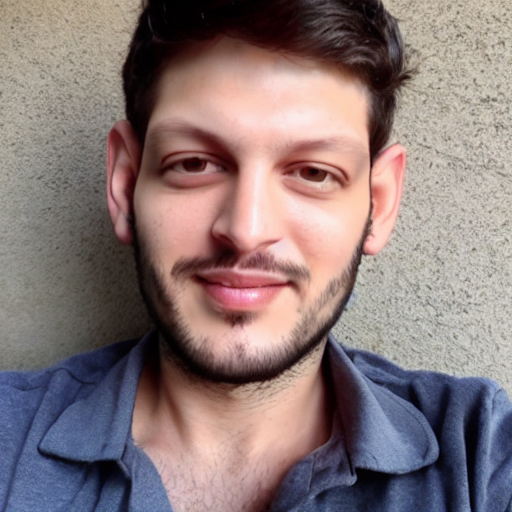

outputs/txt2img-samples/photo of a meuri person_4.png


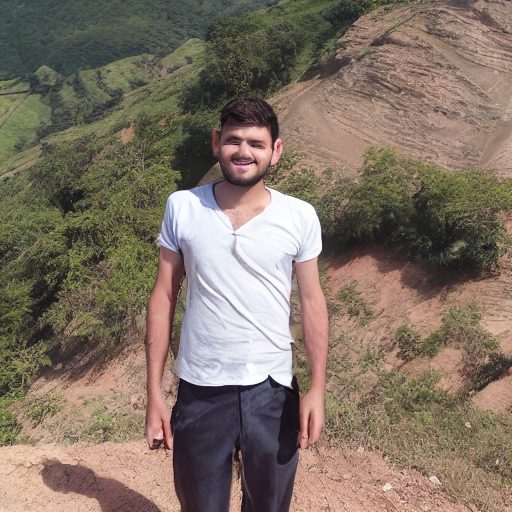

outputs/txt2img-samples/photo of a meuri person_5.png


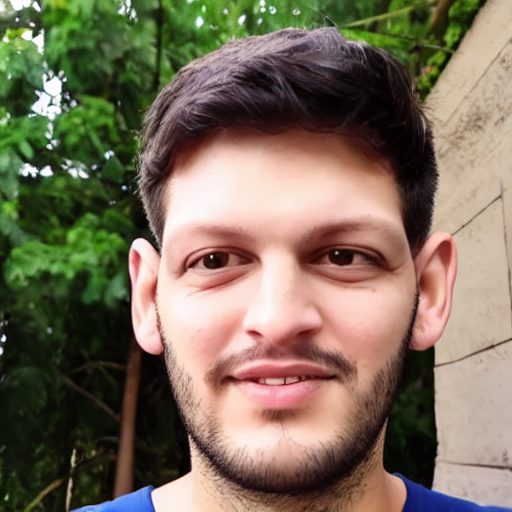

outputs/txt2img-samples/photo of a meuri person_6.png


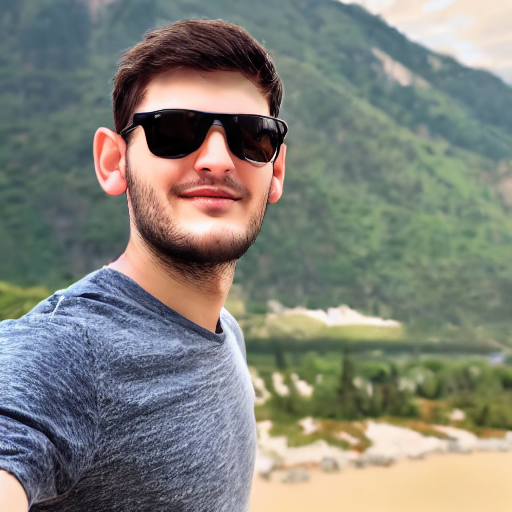

outputs/txt2img-samples/photo of a meuri person_7.png


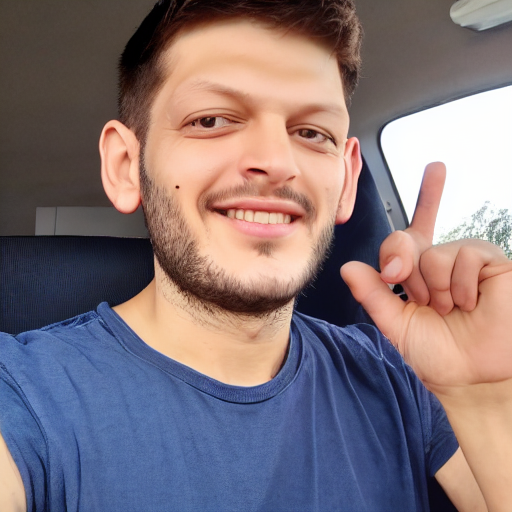

outputs/txt2img-samples/photo of a meuri person_8.png


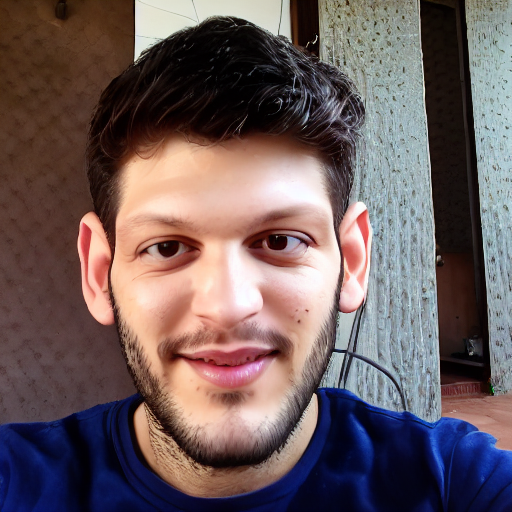

outputs/txt2img-samples/photo of a meuri person_9.png


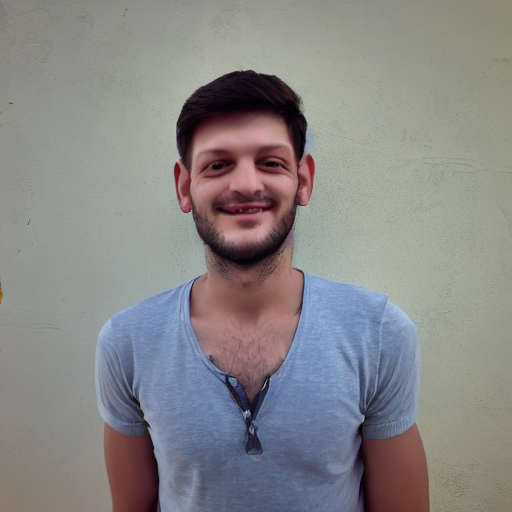

outputs/txt2img-samples/photo of a meuri person_10.png


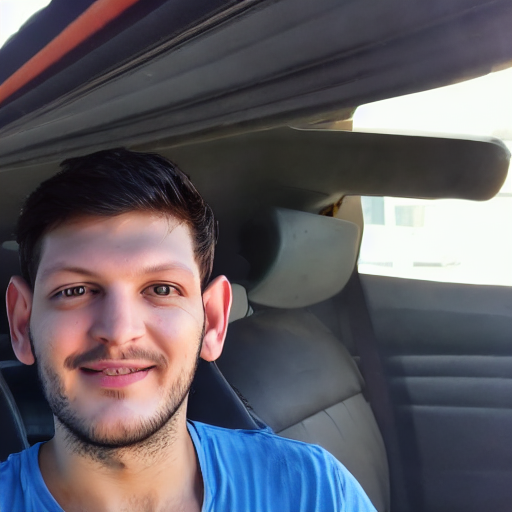

outputs/txt2img-samples/photo of a meuri person_11.png


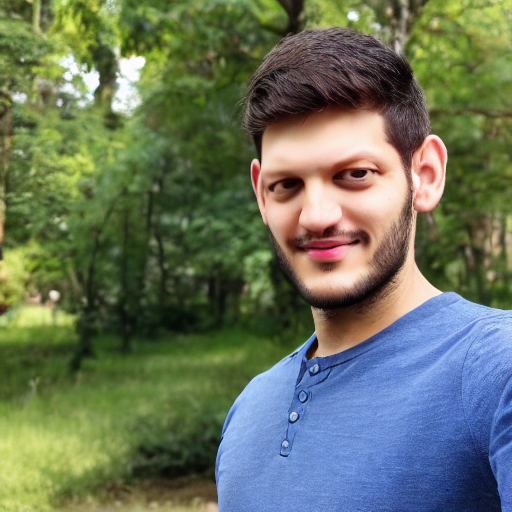

outputs/txt2img-samples/photo of a meuri person_12.png


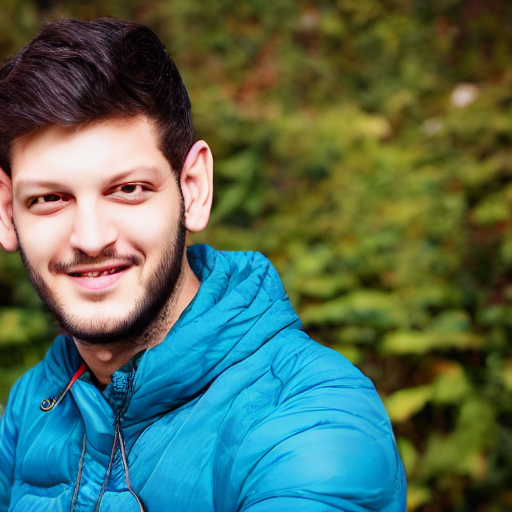

outputs/txt2img-samples/photo of a meuri person_13.png


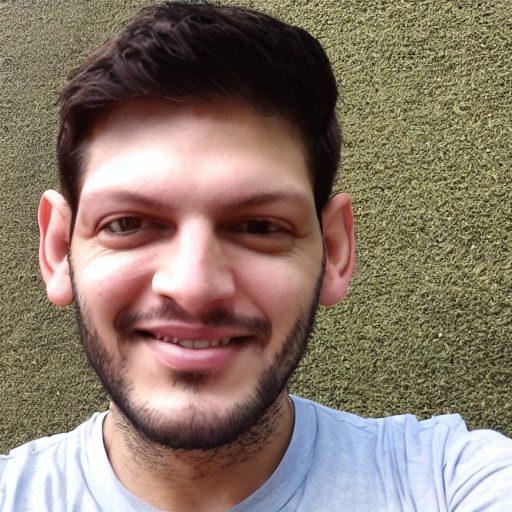

outputs/txt2img-samples/photo of a meuri person_14.png


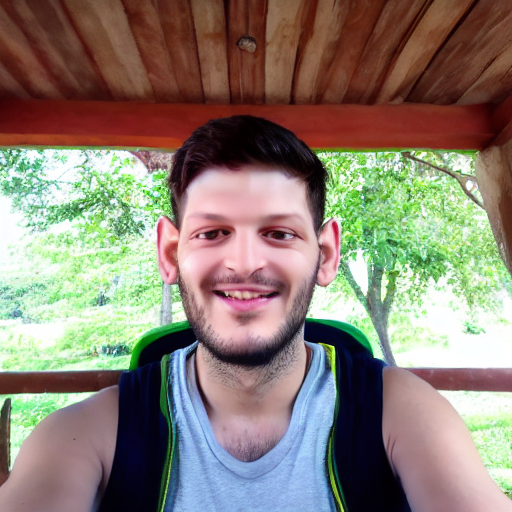

outputs/txt2img-samples/photo of a meuri person_15.png


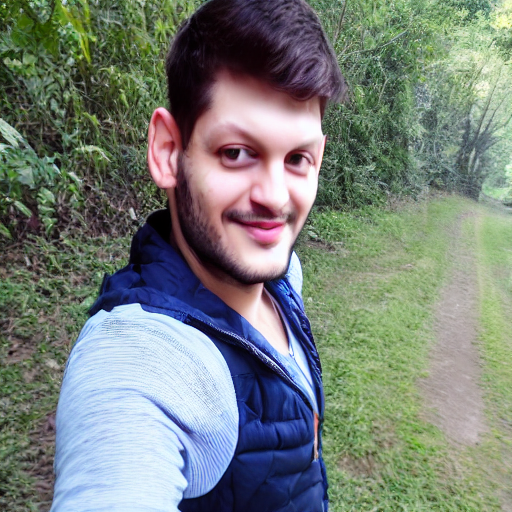

In [3]:
from IPython.display import Image, display

folder = "outputs/txt2img-samples/"

def draw(num, st):
    listOfImageNames = [str(n) + '.png' for n in range(0, num)]
    for imageName in listOfImageNames:
        filenamex = str(folder+st+"_"+imageName)
        print(filenamex)
        display(Image(filename=filenamex))

#draw(4, "meuri person as a masterpiece portrait painting by John Singer Sargent in the style of Rembrandt")
#draw(4, "meuri person as a masterpiece portrait surrounded by dollars")
#draw(4, "meuri person surrounded by many green dollar bills")
#draw(4, "a realistic meuri person surrounded by many dollar bills")
#draw(4, "a realistic meuri person counting dollars")
#draw(4, "a meuri person photo with dollar bills") #100 steps
#draw(4, "a meuri person photo in the beach") #250 steps
#draw(1, "a meuri person photo in beautiful beach") # puse 400 steps hizo con 500
#draw(1, "a meuri person photo in a beautiful beach") # puse 400 steps hizo con 500
#draw(4, "a photo of a meuri person walking in a beautiful beach") # puse 499 steps hizo con 500
#draw(4, "a photo of a meuri person with sunglasses in a beautiful beach") # puse 499 steps hizo con 500 y 3 n_samples
#draw(1, "a meuri person as a masterpiece portrait painting by John Singer Sargent in the style of Rembrandt") #scale 10 steps 499
#draw(1, "a meuri person as a CEO of a large corporation.")
#draw(4, "meuri person as a CEO of a large corporation.")
#draw(4, "photo of a muscular meuri person")
#draw(8,"photo of a meuri person in a suit")
#draw(16,"photo of a meuri person")
draw(16,"photo of a meuri person driving a Lamborghini Diablo Car")

#for prompt in prompts:
#    draw(prompt[0], prompt[1])

In [9]:
# Check current path
import pathlib
pathlib.Path().resolve()

PosixPath('/home/ubuntu/train/JoePenna')

In [3]:
# Use DotCSV model
!python scripts/stable_txt2img.py \
 --ddim_eta 0.0 \
 --n_samples 1 \
 --n_iter 4 \
 --scale 7.0 \
 --ddim_steps 50 \
 --ckpt "../model_dotcsv_v2.ckpt" \
 --prompt "dotcsv person walking with a dog"

Global seed set to 42
Loading model from ../model_dotcsv_v2.ckpt
Global Step: 2500
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels
Downloading: 100%|███████████████████████████| 961k/961k [00:00<00:00, 39.3MB/s]
Downloading: 100%|███████████████████████████| 525k/525k [00:00<00:00, 37.8MB/s]
Downloading: 100%|██████████████████████████████| 905/905 [00:00<00:00, 834kB/s]
Downloading: 100%|█████████████████████████| 4.52k/4.52k [00:00<00:00, 3.52MB/s]
Downloading: 100%|█████████████████████████| 1.71G/1.71G [00:37<00:00, 45.1MB/s]
Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.1.self_attn.q_proj.weight', 'vision_model.encoder.layers.7.self_attn.k_proj.weight', 'vision_model.encoder.la

data:   0%|                                               | 0/1 [00:00<?, ?it/s]Data shape for DDIM sampling is (1, 4, 64, 64), eta 0.0
Running DDIM Sampling with 50 timesteps


DDIM Sampler:   0%|                                      | 0/50 [00:00<?, ?it/s]

DDIM Sampler:   2%|▌                             | 1/50 [00:03<02:55,  3.59s/it]

DDIM Sampler:   4%|█▏                            | 2/50 [00:07<02:49,  3.53s/it]

DDIM Sampler:   6%|█▊                            | 3/50 [00:10<02:45,  3.52s/it]

DDIM Sampler:   8%|██▍                           | 4/50 [00:14<02:41,  3.51s/it]

DDIM Sampler:  10%|███                           | 5/50 [00:17<02:37,  3.51s/it]

DDIM Sampler:  12%|███▌                          | 6/50 [00:21<02:34,  3.51s/it]

DDIM Sampler:  14%|████▏                         | 7/50 [00:24<02:30,  3.51s/it]

DDIM Sampler:  16%|████▊                         | 8/50 [00:28<02:27,  3.51s/it]

DDIM Sampler:  18%|█████▍                        | 9/50 [00:31<02:23,  3.51s/it]

DD

DDIM Sampler:  36%|██████████▍                  | 18/50 [01:03<01:52,  3.52s/it]

DDIM Sampler:  38%|███████████                  | 19/50 [01:07<01:49,  3.52s/it]

DDIM Sampler:  40%|███████████▌                 | 20/50 [01:10<01:45,  3.52s/it]

DDIM Sampler:  42%|████████████▏                | 21/50 [01:14<01:42,  3.53s/it]

DDIM Sampler:  44%|████████████▊                | 22/50 [01:17<01:38,  3.53s/it]

DDIM Sampler:  46%|█████████████▎               | 23/50 [01:21<01:35,  3.53s/it]

DDIM Sampler:  48%|█████████████▉               | 24/50 [01:24<01:31,  3.53s/it]

DDIM Sampler:  50%|██████████████▌              | 25/50 [01:28<01:28,  3.53s/it]

DDIM Sampler:  52%|███████████████              | 26/50 [01:31<01:24,  3.52s/it]

DDIM Sampler:  54%|███████████████▋             | 27/50 [01:35<01:21,  3.53s/it]

DDIM Sampler:  56%|████████████████▏            | 28/50 [01:38<01:17,  3.53s/it]

DDIM Sampler:  58%|████████████████▊            | 29/50 [01:42<01:14,  3.53s/it]

DDIM Sampler:  6